<a href="https://colab.research.google.com/github/Morningstar1998/Feature_detection_for_industrial_buildings/blob/master/Glove_dataset_IEMOCAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
 from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive  

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists


In [ ]:
!pip install -q tensorflow-text
!pip install -q tf-models-official
!pip install -q sklearn

In [ ]:
!pip install tensorflow-text
import tensorflow_text as text

In [ ]:
import tensorflow as tf
import tensorflow_text as text


from numpy import array
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers.core import Activation, Dropout, Dense
from keras.layers import Flatten, LSTM,SimpleRNN,GRU,RNN
from keras.layers import GlobalMaxPooling1D
from keras.models import Model
from keras.layers.embeddings import Embedding
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer
from keras.layers import Input
from keras.layers.merge import Concatenate
from tensorflow.keras import layers

import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt

from numpy import array
from numpy import asarray
from numpy import zeros


import tensorflow_hub as hub
import tensorflow as tf
from official.nlp import optimization 
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
import tensorflow as tf
from sklearn.model_selection import train_test_split
from __future__ import absolute_import, division, print_function, unicode_literals
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.text import Tokenizer

In [ ]:
pd.set_option('max_rows', 99999)
pd.set_option('max_colwidth', 400)
pd.describe_option('max_colwidth')

display.max_colwidth : int or None
    The maximum width in characters of a column in the repr of
    a pandas data structure. When the column overflows, a "..."
    placeholder is embedded in the output. A 'None' value means unlimited.
    [default: 50] [currently: 400]


In [ ]:
dataset=pd.read_csv('/content/gdrive/MyDrive/Clasificador/text_train.csv')

In [ ]:
def adding_new_data(dataframe_input):
  place=0
  for sent in dataframe_input['sentiment']:
    if sent==0:
      dataframe_input['anger'][place]=1
    elif sent==1:
      dataframe_input['happy'][place]=1
    elif sent==2:
      dataframe_input['exc'][place]=1
    elif sent==3:
      dataframe_input['sad'][place]=1
    elif sent==4:
      dataframe_input['frustraded'][place]=1
    elif sent==5:
      dataframe_input['fear'][place]=1
    elif sent==6:
      dataframe_input['sur'][place]=1
    elif sent==7:
      dataframe_input['neu'][place]=1
    elif sent==8:
      dataframe_input['xxx/outh'][place]=1
    place += 1
  dataframe_input['anger']=dataframe_input['anger'].replace(np.nan, 0)
  dataframe_input['happy']=dataframe_input['happy'].replace(np.nan, 0)
  dataframe_input['exc']=dataframe_input['exc'].replace(np.nan, 0)
  dataframe_input['sad']=dataframe_input['sad'].replace(np.nan, 0)
  dataframe_input['frustraded']=dataframe_input['frustraded'].replace(np.nan, 0)
  dataframe_input['fear']=dataframe_input['fear'].replace(np.nan,0)
  dataframe_input['sur']=dataframe_input['sur'].replace(np.nan,0)
  dataframe_input['neu']=dataframe_input['neu'].replace(np.nan,0)
  dataframe_input['xxx/outh']=dataframe_input['xxx/outh'].replace(np.nan,0)
  return dataframe_input


In [ ]:
def data (dataset_raw,x):
  data=dataset_raw
  labels=data['label']
  text=data['transcription']
  text=np.array([text])
  labels=np.array([labels])
  data4=pd.DataFrame([text[0],labels[0]])
  data4=data4.T
  data4.columns=['text','sentiment']
  data4["anger"] = np.nan
  data4["happy"] = np.nan
  data4["exc"] = np.nan
  data4["sad"] = np.nan
  data4["frustraded"] = np.nan
  data4["fear"] = np.nan
  data4["sur"] = np.nan
  data4["neu"] = np.nan
  data4["xxx/outh"] = np.nan
  
  data4=adding_new_data(data4)
  return data4

In [ ]:
train=data (dataset,'train')
test=data (dataset,'test')
validation=data (dataset,'validation')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: Se

In [ ]:
train.to_csv('train.csv')
test.to_csv('test.csv')
validation.to_csv('validation.csv')

In [ ]:
train.head(10)

,text,sentiment,anger,happy,exc,sad,frustraded,fear,sur,neu,xxx/outh
0,we were very much younger then .,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,goddamn it augie don t ask me that . i hate it when you ask me that . you always ask me that . it s insulting .,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,i would like to talk to your supervisor . obviously you re incompetent and don t understand what i m asking .,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,why didn t you let me know ?,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,i know .,3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
5,yeah that s awesome .,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6,you never did .,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
7,i understand that . i would know if it was mine . um,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,garbage i m going to live on campus . i mean well around campus anyway . yeah housing around campus .,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
9,but if i can t have that here then i ll get out .,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
print(train.size)

66198


In [ ]:
concat_data=[train,test,validation]
train = pd.concat(concat_data)

In [ ]:
train

,text,sentiment,anger,happy,exc,sad,frustraded,fear,sur,neu,xxx/outh
0,we were very much younger then .,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,goddamn it augie don t ask me that . i hate it when you ask me that . you always ask me that . it s insulting .,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,i would like to talk to your supervisor . obviously you re incompetent and don t understand what i m asking .,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,why didn t you let me know ?,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,i know .,3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
5,yeah that s awesome .,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6,you never did .,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
7,i understand that . i would know if it was mine . um,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,garbage i m going to live on campus . i mean well around campus anyway . yeah housing around campus .,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
9,but if i can t have that here then i ll get out .,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
print(train.size)

198594


In [ ]:
place=168
filter = train["text"] != ""
train = train[filter]
train = train.dropna()
print('text: ' + train["text"][place])
print("label:" + str(train["sentiment"][place]))

168    text: i want you to i want you to act like he is coming back both of you . don t think i haven t noticed you since chris invited her here .
168    text: i want you to i want you to act like he is coming back both of you . don t think i haven t noticed you since chris invited her here .
168    text: i want you to i want you to act like he is coming back both of you . don t think i haven t noticed you since chris invited her here .
Name: text, dtype: object
label:168    0
168    0
168    0
Name: sentiment, dtype: object


In [ ]:
#train_labels = train[['anger','happy','exc','sad','frustraded','sur','neu','xxx/outh']]
#train_labels = train[['anger','sad','frustraded','neu']]
#train_labels = train[['anger','frustraded','neu']]
train_labels = train[['frustraded','neu']]
#classes=train_labels.count(axis='columns')
classes=train_labels.shape
classes=classes[1]

print(classes)
train_labels.head()

2


,frustraded,neu
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0


In [ ]:
train_labels.head()

,frustraded,neu
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0


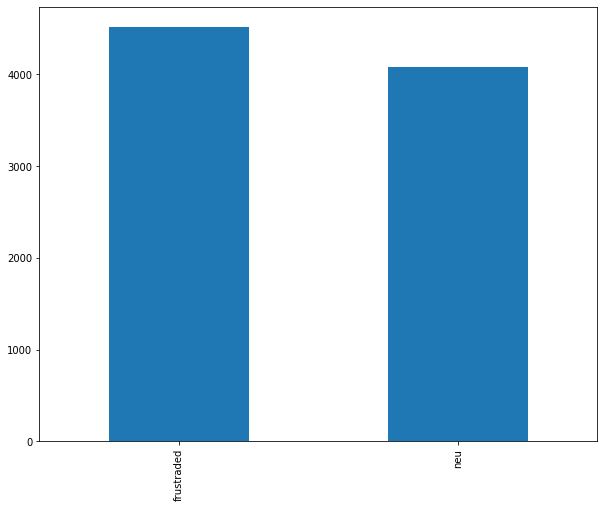

In [ ]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 8
plt.rcParams["figure.figsize"] = fig_size
train_labels.sum(axis=0).plot.bar()

In [ ]:
def preprocess_text(sen):
    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sen)
    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)
    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)
    return sentence

In [ ]:
X = []
sentences = list(train["text"])
for sen in sentences:
    X.append(preprocess_text(sen))

y = train_labels.values

In [ ]:
X[1:10]

['goddamn it augie don ask me that hate it when you ask me that you always ask me that it insulting ',
 'i would like to talk to your supervisor obviously you re incompetent and don understand what m asking ',
 'why didn you let me know ',
 'i know ',
 'yeah that awesome ',
 'you never did ',
 'i understand that would know if it was mine um ',
 ' garbage m going to live on campus mean well around campus anyway yeah housing around campus ',
 'but if can have that here then ll get out ']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [ ]:
print(y_train)

[[1. 0.]
 [0. 0.]
 [1. 0.]
 ...
 [0. 1.]
 [0. 1.]
 [0. 0.]]


In [ ]:
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train)
print(X_train)

['well can at least have my fifty dollars please ', 'it the think', 'i can go have to go back to work don have time to go back to my house and get all of that stuff and then get back in line and wait for another forty five minutes ', 'you don know that ', 'well no one even told me about that like why would think to buy insurance was it like three hour flight ', 'umm and m going to check out school and get you know check out the courses', 'goddamn it augie don ask me that hate it when you ask me that you always ask me that it insulting ', 'out there there like this big mass of silver fish they re heading this way ', 'it not rocket science ', 'i don care then ', 'you re kidding me right you re going to give me fifty dollars to completely cover my bag everything that was in it the inconvenience that ve gone through paid for my ticket all expect is to safely get to my destination with my stuff is that so much to ask mean really don think that that big deal to ask you guys to have my bag in

In [ ]:
X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)
print(X_train)

[[35, 17, 55, 315, 18, 30, 230, 264, 245], [3, 6, 56], [8, 17, 43, 18, 2, 43, 72, 2, 124, 14, 18, 63, 2, 43, 72, 2, 30, 345, 4, 42, 32, 10, 5, 201, 4, 60, 42, 72, 24, 110, 4, 227, 21, 310, 631, 291, 486], [1, 14, 7, 5], [35, 23, 68, 149, 261, 20, 58, 5, 13, 64, 79, 56, 2, 835, 881, 36, 3, 13, 108, 312, 325], [550, 4, 28, 34, 2, 427, 47, 243, 4, 42, 1, 7, 427, 47, 6, 1815], [836, 3, 231, 14, 172, 20, 5, 277, 3, 101, 1, 172, 20, 5, 1, 176, 172, 20, 5, 3, 729], [47, 40, 40, 13, 19, 262, 1167, 10, 671, 118, 38, 27, 1284, 19, 126], [3, 25, 1213, 1041], [8, 14, 211, 60], [1, 27, 514, 20, 39, 1, 27, 34, 2, 129, 20, 230, 264, 2, 515, 1042, 30, 198, 143, 5, 36, 24, 3, 6, 935, 5, 54, 418, 219, 487, 21, 30, 536, 32, 572, 16, 2, 1729, 42, 2, 30, 1214, 44, 30, 201, 16, 5, 22, 109, 2, 172, 31, 66, 14, 56, 5, 5, 262, 581, 2, 172, 1, 241, 2, 18, 30, 198, 24, 6, 301, 107, 221, 4, 60, 222, 30, 198, 107, 333, 61], [75], [35, 76, 9, 11, 18, 59, 48], [60, 3, 130, 12, 30, 123], [23, 23, 5, 25, 30, 202, 6, 2

In [ ]:
vocab_size = len(tokenizer.word_index) + 1

maxlen = 50

X_train = pad_sequences(X_train, padding='post', maxlen=maxlen)
X_test = pad_sequences(X_test, padding='post', maxlen=maxlen)
print(X_train[1])

[ 3  6 56  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0]


In [ ]:
print(X_train[2])

[  8  17  43  18   2  43  72   2 124  14  18  63   2  43  72   2  30 345
   4  42  32  10   5 201   4  60  42  72  24 110   4 227  21 310 631 291
 486   0   0   0   0   0   0   0   0   0   0   0   0   0]


In [ ]:
print(X_train[3])

[ 1 14  7  5  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0]


In [ ]:
embeddings_dictionary = dict()
glove_file = open('/content/gdrive/MyDrive/Clasificador/glove.6B.100d.txt', encoding="utf8")

for line in glove_file:
    records = line.split()
    word = records[0]
    vector_dimensions = asarray(records[1:], dtype='float32')
    embeddings_dictionary[word] = vector_dimensions
glove_file.close()

embedding_matrix = zeros((vocab_size, 100))
for word, index in tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector
#print(embedding_matrix)

In [ ]:
deep_inputs = Input(shape=(None,))
print(deep_inputs)
net = Embedding(vocab_size, 100, weights=[embedding_matrix], trainable=False,mask_zero=True,name = 'embeddings')(deep_inputs)
print(net)
net = SimpleRNN(200, return_sequences=True,name='RNN')(net)
net = GRU(100, return_sequences=True,name='GRU')(net)
net = LSTM(150,name='lstm_layer')(net)
#net = tf.keras.layers.Conv1D(filters=64, kernel_size=3, padding='same', activation=None, kernel_initializer='he_uniform')(net)
#net = tf.keras.layers.MaxPooling1D(3)(net)
#net = tf.keras.layers.GlobalMaxPool1D()(net)
#net = tf.keras.layers.BatchNormalization()(net)
#net=tf.keras.layers.Dropout(0.2)(net)
#net = Dense(25,activation=None)(net)
#net = Dense(12,activation=None)(net)
#net = Dense(6,activation=None)(net)
net = Dense(classes,activation='sigmoid')(net)
model2= Model(inputs=deep_inputs, outputs=net)
opt = tf.optimizers.Adam(learning_rate=0.01)
model2.compile(loss='binary_crossentropy', optimizer=opt, metrics=['acc'])
print(model2.summary())

KerasTensor(type_spec=TensorSpec(shape=(None, None), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, None, 100), dtype=tf.float32, name=None), name='embeddings/embedding_lookup/Identity_1:0', description="created by layer 'embeddings'")
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None)]            0         
_________________________________________________________________
embeddings (Embedding)       (None, None, 100)         285200    
_________________________________________________________________
RNN (SimpleRNN)              (None, None, 200)         60200     
_________________________________________________________________
GRU (GRU)                    (None, None, 100)         90600     
_______________________________________________________________

In [ ]:
history = model2.fit(X_train, y_train, batch_size=32, epochs=25, verbose=1, validation_split=0.2)

Epoch 1/25
362/362 [==============================] - 55s 84ms/step - loss: 0.5615 - acc: 0.6454 - val_loss: 0.5431 - val_acc: 0.6895
Epoch 2/25
362/362 [==============================] - 28s 78ms/step - loss: 0.5356 - acc: 0.6758 - val_loss: 0.5362 - val_acc: 0.3399
Epoch 3/25
362/362 [==============================] - 28s 78ms/step - loss: 0.5358 - acc: 0.6022 - val_loss: 0.5461 - val_acc: 0.7470
Epoch 4/25
362/362 [==============================] - 28s 78ms/step - loss: 0.5376 - acc: 0.5864 - val_loss: 0.5349 - val_acc: 0.2388
Epoch 5/25
362/362 [==============================] - 28s 78ms/step - loss: 0.5340 - acc: 0.6454 - val_loss: 0.5238 - val_acc: 0.7182
Epoch 6/25
362/362 [==============================] - 28s 77ms/step - loss: 0.5285 - acc: 0.5847 - val_loss: 0.5320 - val_acc: 0.4524
Epoch 7/25
362/362 [==============================] - 28s 79ms/step - loss: 0.5271 - acc: 0.6248 - val_loss: 0.5227 - val_acc: 0.7009
Epoch 8/25
362/362 [==============================] - 28s 78ms

In [ ]:
score = model2.evaluate(X_test, y_test, verbose=1)

print("Test Score:", score[0])
print("Test Accuracy:", score[1])

113/113 [==============================] - 1s 11ms/step - loss: 0.5273 - acc: 0.6281
Test Score: 0.5272558927536011
Test Accuracy: 0.6280808448791504


In [ ]:
def convert2embeding (word):
  X = []
  sentences = list(word)
  #print(sentences)
  for sen in sentences:
    X.append(preprocess_text(sen))
  #print(X)
  token_word=tokenizer.texts_to_sequences(X[0])
  #print(token_word)
  final=[]
  for tok in token_word:
    try:
      final.append(tok[0])
    except:
      final.append(0)
  #print(final)
  maxlen = 50
  final_word = pad_sequences([final], padding='post', maxlen=maxlen)
  #print(final_word)
  return final_word
word2='Beatiful world baby'
x=convert2embeding ([word2])
print(x)

[[   0 2148   88 1509    8 1383 1695 1297    0    0    0    0 1297  235
     0    0   88    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0]]


In [ ]:
model2.save('path_to_my_model.h5')
new_model = keras.models.load_model('path_to_my_model.h5')

In [ ]:
new_predictions = new_model.predict(x)
print(new_predictions)

[[0.18124756 0.22698121]]


In [ ]:
X_train[1]

array([ 3,  6, 56,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
      dtype=int32)

In [ ]:
ll=800
y_train[ll]

array([0., 0.])

In [ ]:
#new_model(X_train[1])
new_model.predict(X_train[ll])
#np.argmax(new_model.predict(X_train[ll]),axis=1)

array([[0.0990266 , 0.36496523],
       [0.14723201, 0.49662477],
       [0.18617527, 0.30109844],
       [0.15825748, 0.32174525],
       [0.07483064, 0.55687606],
       [0.39051023, 0.2801498 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.5507731 , 0.4516976 ],
       [0.

In [ ]:
X_train.dtype

dtype('int32')

In [ ]:
#Many
y='beatiful world baby'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,' ',a)
y='hate you'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='very bored'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='i was so happy back then'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='i am so happy'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='is so scary'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='i hate my life'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='i love you'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='let´s party all night!!!!'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='lets have some fun baby'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='i want to kill myself'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y='fucking bitch'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y= 'i am so sad'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)
y= 'i used to be happy'
x2=convert2embeding([y])
a = model2.predict(x2)
print(y,'---- ',a)


beatiful world baby   [[0.18124756 0.22698121]]
hate you ----  [[0.4917788  0.13558303]]
very bored ----  [[0.17488895 0.2315035 ]]
i was so happy back then ----  [[0.2606108 0.1859533]]
i am so happy ----  [[0.26026753 0.18626425]]
is so scary ----  [[0.2605659  0.18594773]]
i hate my life ----  [[0.26061094 0.18595316]]
i love you ----  [[0.25723076 0.18880068]]
let´s party all night!!!! ----  [[0.3110163  0.23055893]]
lets have some fun baby ----  [[0.31101424 0.23055893]]
i want to kill myself ----  [[0.2606124  0.18594955]]
fucking bitch ----  [[0.24549237 0.36922082]]
i am so sad ----  [[0.26060385 0.18596108]]
i used to be happy ----  [[0.260634   0.18586609]]


In [ ]:
['anger','happy','exc','sad','frustraded','sur','neu','xxx/outh']
['anger','sad','frustraded','neu']
['anger','frustraded','neu']
['frustraded','neu']


['frustraded', 'neu']

In [ ]:
history_dict = history.history
print(history_dict.keys())

acc = history_dict['acc']
val_acc = history_dict['val_acc']
loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs = range(1, len(acc) + 1)
fig = plt.figure(figsize=(10, 6))
fig.tight_layout()

plt.subplot(2, 1, 1)
# "bo" is for "blue dot"
plt.plot(epochs, loss, 'r', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
# plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')